In [1]:
import os
import random
from tqdm import tqdm
import argparse
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import random_split, DataLoader, TensorDataset
from torch.distributions.categorical import Categorical
import matplotlib.pyplot as plt
from torchsummary import summary
from functools import partial
from warnings import warn
# import pytorch_lightning as pl
# from pytorch_lightning.metrics import functional
# from pytorch_lightning.callbacks import LearningRateMonitor
# from pytorch_lightning.loggers import TensorBoardLogger
import time
import sys
sys.path.append('/content/drive/MyDrive/Python scripts')
import constants

if torch.cuda.is_available():
    use_cuda = True
    torch.backends.cudnn.benchmark = True
    dflt_device = torch.device('cuda')
    print(f'GPU available: {torch.cuda.get_device_name(0)} ({torch.cuda.device_count()} count)')
else:
    dflt_device = torch.device('cpu')
    print('No GPU available')
print(f'Default device: {dflt_device}')

No GPU available
Default device: cpu


In [2]:
class utils():
  @staticmethod
  def dna2tensor(sequence_str, vocab_list=['A','C','G','T']):
      seq_tensor = np.zeros((len(vocab_list), len(sequence_str)))
      for letterIdx, letter in enumerate(sequence_str):
          seq_tensor[vocab_list.index(letter), letterIdx] = 1
      seq_tensor = torch.Tensor(seq_tensor)
      return seq_tensor

  @staticmethod
  def first_token_rewarder(sequences, pct=1.):
      weights = torch.zeros_like(sequences)
      weights[:,0,:] = 1
      rewards = (weights * sequences).sum(2).sum(1).div(sequences.shape[2])
      rewards = rewards.view(-1, 1)
      return 1 - abs(rewards - pct)

  @staticmethod
  def create_paddingTensors(num_sequences, padding_len, num_st_samples=1, for_multi_sampling=True):
      assert padding_len >= 0 and type(padding_len) == int, 'Padding must be a nonnegative integer'
      upPad_logits, downPad_logits = None, None  
      if padding_len > 0:
          assert padding_len <= (len(constants.MPRA_UPSTREAM) + len(constants.MPRA_DOWNSTREAM)), 'Not enough padding available'
          upPad_logits, downPad_logits = utils.dna2tensor(constants.MPRA_UPSTREAM), \
                                      utils.dna2tensor(constants.MPRA_DOWNSTREAM)
          upPad_logits, downPad_logits = upPad_logits[:,-padding_len//2 + padding_len%2:], \
                                      downPad_logits[:,:padding_len//2 + padding_len%2]
          if for_multi_sampling:
              upPad_logits, downPad_logits = upPad_logits.repeat(num_st_samples, num_sequences, 1, 1), \
                                          downPad_logits.repeat(num_st_samples, num_sequences, 1, 1)                                     
          else:
              upPad_logits, downPad_logits = upPad_logits.repeat(num_sequences, 1, 1), \
                                          downPad_logits.repeat(num_sequences, 1, 1)  
      return upPad_logits, downPad_logits

In [3]:
# Adapted from https://github.com/samsinai/FLEXS/blob/master/flexs/baselines/explorers/adalead.py
class AdaLead(nn.Module):
    def __init__(self,
                 fitness_fn = None,
                 measured_sequences = None,
                 sequences_batch_size = 6,
                 model_queries_per_batch = 200,
                 seq_len = 200, 
                 padding_len = 400,
                 vocab = constants.STANDARD_NT,
                 mu = 1,
                 recomb_rate = 0,
                 threshold = 0.05,
                 rho = 0,
                 eval_batch_size = 20,
                 **kwargs):
        
        super(AdaLead, self).__init__()
        self.fitness_fn = fitness_fn
        self.measured_sequences = measured_sequences
        self.sequences_batch_size = sequences_batch_size
        self.model_queries_per_batch = model_queries_per_batch
        self.seq_len = seq_len
        self.padding_len = padding_len
        self.vocab = vocab
        self.mu = mu                                    #number of mutations per sequence.
        self.recomb_rate = recomb_rate
        self.threshold = threshold
        self.rho = rho                                  #number of recombinations per generation
        self.eval_batch_size = eval_batch_size
        self.vocab_len = len(self.vocab)
        self.model_cost = 0
        
        upPad_logits, downPad_logits = utils.create_paddingTensors(num_sequences=1,
                                                                   padding_len=self.padding_len, 
                                                                   for_multi_sampling=False)
        self.register_buffer('upPad_logits', upPad_logits)
        self.register_buffer('downPad_logits', downPad_logits)

        #This tensor is used to get the device of the model in .propose_sequences()
        #since the padding tensors are None is padding_len=0.
        #The device is used in .run()
        self.register_buffer('device_reference_tensor', torch.zeros(1))    
        self.dflt_device = self.device_reference_tensor.device
        
    def get_fitness(self, sequence_list):
        self.model_cost += len(sequence_list)
        batch = self.string_list_to_tensor(sequence_list).to(self.dflt_device)
        batch = self.pad(batch)
        fitnesses = self.fitness_fn(batch)
        return fitnesses.squeeze().cpu().numpy()
    
    def string_list_to_tensor(self, sequence_list):
        batch_len = len(sequence_list)
        batch_tensor_size = (batch_len, self.vocab_len, self.seq_len)
        batch_tensor = torch.zeros(batch_tensor_size)
        for idx, seq_str in enumerate(sequence_list):
            tensor = utils.dna2tensor(seq_str)
            batch_tensor[idx, :, :] = tensor
        self.register_buffer('batch_tensor', batch_tensor)
        return batch_tensor
             
    def pad(self, tensor):
        if self.padding_len > 0:
            batch_len = tensor.shape[0]
            upPad_logits, downPad_logits = self.upPad_logits.repeat(batch_len, 1, 1), \
                                           self.downPad_logits.repeat(batch_len, 1, 1) 
            return torch.cat([ upPad_logits, tensor, downPad_logits], dim=-1)
        else:
            return tensor
    
    def start_from_random_sequences(self, num_sequences):
        sequence_list = []
        for seq_idx in range(num_sequences):
            sequence_list.append( ''.join(random.choice(self.vocab) for i in range(self.seq_len)) )
        return sequence_list
    
    @staticmethod
    def generate_random_mutant(sequence: str, mu: float, alphabet: str):
        mutant = []
        for s in sequence:
            if random.random() < mu:
                mutant.append(random.choice(alphabet))
            else:
                mutant.append(s)
        return "".join(mutant)
    
    def recombine_population(self, gen):
        # If only one member of population, can't do any recombining
        if len(gen) == 1:
            return gen
        random.shuffle(gen)
        ret = []
        for i in range(0, len(gen) - 1, 2):
            strA = []
            strB = []
            switch = False
            for ind in range(len(gen[i])):
                if random.random() < self.recomb_rate:
                    switch = not switch
                # putting together recombinants
                if switch:
                    strA.append(gen[i][ind])
                    strB.append(gen[i + 1][ind])
                else:
                    strB.append(gen[i][ind])
                    strA.append(gen[i + 1][ind])
            ret.append("".join(strA))
            ret.append("".join(strB))
        return ret
    
    def propose_sequences(self, initial_sequences): #from_last_checkpoint=False):              
        """Propose top `sequences_batch_size` sequences for evaluation."""
        measured_sequence_set = set(initial_sequences)
        measured_fitnesses = self.get_fitness(initial_sequences)
        #print(measured_fitnesses)
        
        # Get all sequences within `self.threshold` percentile of the top_fitness
        top_fitness = measured_fitnesses.max()
        top_inds = np.argwhere((measured_fitnesses >= top_fitness * (
                                    1 - np.sign(top_fitness) * self.threshold)))
        top_inds = top_inds.reshape(-1).tolist()
        self.initial_top_fitness = top_fitness
        #print(top_inds)
        #print(f'Initial top fitness: {self.top_fitness}')
        
        parents = [initial_sequences[i] for i in top_inds]
        parents = np.resize(np.array(parents), self.sequences_batch_size,)
        #print(parents)
        
        sequences = {}
        previous_model_cost = self.model_cost
        while self.model_cost - previous_model_cost < self.model_queries_per_batch:
            # generate recombinant mutants
            for i in range(self.rho):
                parents = self.recombine_population(parents)

            for i in range(0, len(parents), self.eval_batch_size):
                # Here we do rollouts from each parent (root of rollout tree)
                roots = parents[i : i + self.eval_batch_size]
                root_fitnesses = self.get_fitness(roots)

                nodes = list(enumerate(roots))

                while (len(nodes) > 0
                       and self.model_cost - previous_model_cost + self.eval_batch_size
                       < self.model_queries_per_batch):
                    child_idxs = []
                    children = []
                    while len(children) < len(nodes):
                        idx, node = nodes[len(children) - 1]

                        child = self.generate_random_mutant(node,
                                                            self.mu * 1 / len(node),
                                                            self.vocab,)

                        # Stop when we generate new child that has never been seen
                        # before
                        if (child not in measured_sequence_set and child not in sequences):
                            child_idxs.append(idx)
                            children.append(child)

                    # Stop the rollout once the child has worse predicted
                    # fitness than the root of the rollout tree.
                    # Otherwise, set node = child and add child to the list
                    # of sequences to propose.
                    fitnesses = self.get_fitness(children).reshape(-1).tolist()
                    sequences.update(zip(children, fitnesses))

                    nodes = []
                    for idx, child, fitness in zip(child_idxs, children, fitnesses):
                        if fitness > root_fitnesses[idx]:
                            nodes.append((idx, child))
                    #print(nodes)
        if len(sequences) == 0:
            raise ValueError(
                "No sequences generated. If `model_queries_per_batch` is small, try "
                "making `eval_batch_size` smaller")

        # We propose the top `self.sequences_batch_size` new sequences we have generated
        new_seqs = np.array(list(sequences.keys()))
        preds = np.array(list(sequences.values()))
        sorted_order = np.argsort(preds)[: -self.sequences_batch_size : -1]
        return new_seqs[sorted_order], preds[sorted_order]
        
    def run(self, num_iterations=10):
        self.dflt_device = self.device_reference_tensor.device    
        if self.measured_sequences is None:
            self.new_seqs = self.start_from_random_sequences(self.sequences_batch_size)
            #print('Starting from random sequences')
        else:
            self.new_seqs = self.measured_sequences
            #print('Starting from given initial sequences')
        pbar = tqdm(range(num_iterations), desc='Iterations')
        for iteration in pbar:
            self.new_seqs, self.preds = self.propose_sequences(self.new_seqs)
            self.final_top_fitness = max(self.preds)
            pbar.set_postfix({'Initial top fitness': self.initial_top_fitness, 'Final top fitness': self.final_top_fitness})

In [4]:
generator = AdaLead(model_queries_per_batch = 5000,
                eval_batch_size = 20,
                sequences_batch_size = 200,
                rho = 50,
                threshold = 0.1,
                recomb_rate = 0.1,
                mu = 1,
                seq_len = 100,
                padding_len = 0,
                fitness_fn = partial(utils.first_token_rewarder, pct=0.98))

#generator.cuda()
t = time.process_time()
generator.run(num_iterations=11)
print('')
print('Top 5 sequences:')
print('')
print(f'{generator.new_seqs[:5]}')
print('')
print(f'Top 5 fitnesses: {generator.preds[:5]}')
print(f'Processing time: {round(time.process_time() - t, 2)} s')

Iterations: 100%|██████████| 11/11 [00:41<00:00,  3.73s/it, Initial top fitness=1, Final top fitness=1]


Top 5 sequences:

['AAAAAAAAAAAAAAAAAATAAAAAAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA'
 'AAAAAAAAAAAAAAAAAAAAAAAAAAGGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA'
 'AAAAAAAAAAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAATAAAAAAAAAAAAAAAAAAAAAAA'
 'AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAATAAAAAAAAAAAAAAAAAAAAAAAAAAACAAAAAAAAAAAAAAAAAAAAAAAAAA'
 'ACAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAACAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA']

Top 5 fitnesses: [1. 1. 1. 1. 1.]
Processing time: 40.86 s


In [ ]:
generator.preds

#REST-Motif experiments

In [5]:
!pip install dmslogo
!pip install biopython

In [6]:
from Bio.Seq import Seq
from Bio import motifs

import imageio
import palettable

import dmslogo
import dmslogo.colorschemes
from dmslogo.colorschemes import CBPALETTE

In [7]:
def motif_str_to_counts(motif_str, pseudocounts=1.0):
    motif = torch.tensor( [ list([ float(y) for y in x.split() ]) for x in motif_str.split('\n') ] )
    return motif.add(pseudocounts)

def counts_to_ppm(in_tensor):
    motif = in_tensor.div( in_tensor.sum(0) )
    return motif

def ppm_to_pwm(in_tensor, bkg=[0.25, 0.25, 0.25, 0.25]):
    motif = in_tensor.div(torch.tensor(bkg).unsqueeze(1)).log2()
    return motif

def ppm_to_U(in_tensor):
    return (in_tensor.log2() * in_tensor).sum(0).mul(-1.)

def ppm_to_IC(in_tensor):
    return in_tensor * ppm_to_U( in_tensor ).mul(-1.).add(2.)

def PWM_to_filter(motif_str):
    motif = torch.tensor( [ list([ float(y) for y in x.split() ]) for x in motif_str.split('\n') ] )
    motif = motif.add(1.).div( motif.add(1.).sum(0) )
    motif = motif.div( motif.add(-1).mul(-1) ).log().clamp(-5,5)
    motif = torch.randn_like(motif).mul(1e-3).add(motif)
    motif = motif.add(-motif.mean(0))
    return motif

def counts_to_filter(in_tensor):
    motif = ppm_to_pwm( counts_to_ppm( in_tensor ) )
    return motif.unsqueeze(0)

def tensor_to_pandas(in_tensor):
    data = []
    my_array = in_tensor.cpu().numpy()
    for nt, score_vec, color in zip(['A','C','G','T'], [ sub_a for sub_a in my_array ], ['green','blue','orange','red']):
         _ = [ data.append([j, nt, score, color]) for j, score in enumerate(score_vec)]
    return pd.DataFrame(data=data, columns=['site', 'letter', 'height','color'])

def counts_to_dms(in_tensor, ax=None):
    motif = counts_to_ppm(in_tensor)
    motif = ppm_to_IC(motif)
    motif = tensor_to_pandas(motif)
    fig, ax = dmslogo.draw_logo(data=motif,
                                x_col='site',
                                letter_col='letter',
                                letter_height_col='height',
                                color_col='color',
                                ax=ax)
    return fig, ax

def matrix_to_dms(in_tensor, ax=None, y_max=2):
    motif = tensor_to_pandas(in_tensor)
    fig, ax = dmslogo.draw_logo(data=motif,
                                x_col='site',
                                letter_col='letter',
                                letter_height_col='height',
                                color_col='color',
                                ax=ax,
                                fixed_ymax=y_max)
    return fig, ax

In [8]:
# # GATA1::TAL1 motif
# motif_string = """1114.00 206.00 318.00 4955.00   0.00   0.00 2049.00 658.00 963.00 1191.00 1778.00 1038.00 1352.00 1885.00 1381.00 110.00 4659.00 160.00
# 2038.00 807.00   0.00   0.00   0.00 4955.00  63.00 1331.00 1214.00 1127.00 1130.00 1237.00 1142.00 1033.00 1237.00 4822.00   0.00 890.00
# 967.00 159.00   0.00   0.00   0.00   0.00  55.00 2214.00 1244.00 1520.00 990.00 1712.00 1466.00 820.00 1884.00  23.00   0.00 3544.00
# 836.00 3783.00 4637.00   0.00 4955.00   0.00 2788.00 752.00 1534.00 1117.00 1057.00 968.00 995.00 1217.00 453.00   0.00 296.00 361.00"""

# PCM = motif_str_to_counts(motif_string)
# PPM = counts_to_ppm(PCM)
# PWM = ppm_to_pwm(PPM)
# ICM = ppm_to_IC(PPM)

In [9]:
# REST motif
motif_string = """211.00  58.00  76.00 1452.00  34.00 122.00 1575.00   3.00  35.00 913.00 219.00  39.00  20.00 1406.00  13.00 1574.00  42.00 205.00 366.00 213.00 179.00
174.00 269.00 1366.00  30.00  44.00 978.00   7.00 1586.00 1481.00 201.00 375.00   7.00   5.00 112.00 1280.00   9.00  13.00 1007.00  31.00 933.00 1114.00
366.00 146.00  50.00  94.00 1516.00 323.00  12.00  12.00  20.00 162.00 124.00 1551.00 1577.00  34.00 233.00   7.00 1530.00 183.00 688.00 319.00  37.00
840.00 1124.00 105.00  26.00  10.00 182.00  12.00   5.00  70.00 329.00 886.00   7.00   2.00  51.00  74.00  10.00   9.00 198.00 507.00 125.00 260.00"""

PCM = motif_str_to_counts(motif_string)
PPM = counts_to_ppm(PCM)
PWM = ppm_to_pwm(PPM)
ICM = ppm_to_IC(PPM)

In [10]:
class simple_score(nn.Module):
    def __init__(self, motif_matrix):
        super().__init__()
        self.register_buffer('motif_matrix', motif_matrix)
    
    def forward(self, in_tensor):
        return (in_tensor * self.motif_matrix).sum()

class hard_motif(nn.Module):
    def __init__(self, motif_matrix):
        super().__init__()
        self.register_buffer('motif_matrix', motif_matrix)
        self.loss  = nn.KLDivLoss(reduction='none', log_target=True)
        
    def forward(self, in_tensor):
        return self.loss( in_tensor, self.motif_matrix ).sum(-1).mean(-1)

class scan_simple_score(nn.Module):
    def __init__(self, motif):
        super().__init__()
        self.motif = motif
        self.filter = nn.Conv1d(motif.shape[0], 1, motif.shape[1], 
                               bias=False)
        self.filter.weight.data = motif.view(1,4,-1)
        self.filter.weight.requires_grad = False
        self.loss  = nn.KLDivLoss(reduction='none', log_target=True)
        
    def forward(self, in_tensor):
        return self.filter(in_tensor)

# motif_divergence = hard_motif(ICM)
# motif_score = simple_score(ICM)
motif_scan_score = scan_simple_score(ICM)

Best motif: TTCAGCACCATGGACAGCGCC
Worst motif: CAGTTACAGGGCTGAGTGCTG



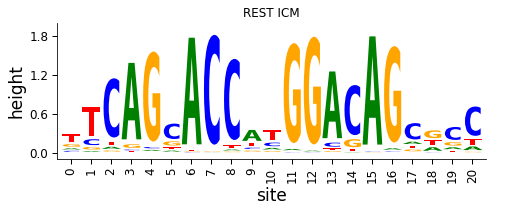

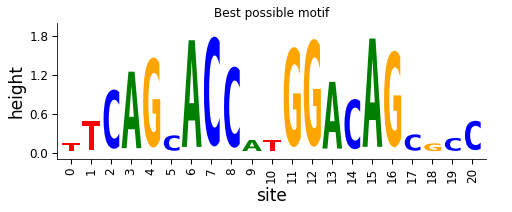

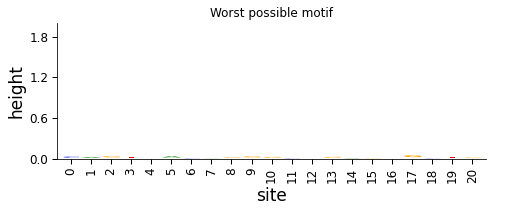

In [11]:
worst_motif = ''
best_motif = ''
vocab_list=['A','C','G','T']
for idx in ICM.min(dim=0).indices.numpy():
  worst_motif += vocab_list[idx]
for idx in ICM.max(dim=0).indices.numpy():
  best_motif += vocab_list[idx]

print(f'Best motif: {best_motif}')
print(f'Worst motif: {worst_motif}')
print('')

fig, ax = matrix_to_dms(ICM)
plt.title('REST ICM')
plt.show()

best_motif = utils.dna2tensor(best_motif)
fig, ax = matrix_to_dms(best_motif*ICM)
plt.title('Best possible motif')
plt.show()

worst_motif = utils.dna2tensor(worst_motif)
fig, ax = matrix_to_dms(worst_motif*ICM)
plt.title('Worst possible motif')
plt.show()

In [12]:
class motif_contrast_score(nn.Module):
    def __init__(self, motif):
        super().__init__()
        self.motif = motif
        self.filter = nn.Conv1d(motif.shape[0], 1, motif.shape[1], 
                               bias=False)
        self.filter.weight.data = motif.view(1,4,-1)
        self.filter.weight.requires_grad = False
        self.loss = nn.KLDivLoss(reduction='mean', log_target=False)
        
    def forward(self, in_tensor):
        all_scores = self.filter(in_tensor)
        max_score = all_scores.max(dim=-1)[0]
        contrast = max_score - (torch.sum(all_scores, dim=-1) - max_score) / (all_scores.shape[2] - 1)
        return contrast #- self.loss(in_tensor[:-1], in_tensor[1:])

class motif_max_score(nn.Module):
    def __init__(self, motif):
        super().__init__()
        self.motif = motif
        self.filter = nn.Conv1d(motif.shape[0], 1, motif.shape[1], 
                               bias=False)
        self.filter.weight.data = motif.view(1,4,-1)
        self.filter.weight.requires_grad = False
        self.loss  = nn.KLDivLoss(reduction='none', log_target=True)
        
    def forward(self, in_tensor):
        return self.filter(in_tensor).max(dim=-1).values

motif_contrast_score = motif_contrast_score(ICM)
motif_max_score = motif_max_score(ICM)

In [13]:
random_motif = 'CATCTGGGCTTCAGGGTCATCAAAGGGAGGAGTTTTTGAAAAGCATTGGCTCATCCTTAGCTGTCATTACAGGTAAAATTCGAGAGGTGAGGCAGCACCACGGACAGCTCCGAGATACCCATTCTCCCAACGCGGTTCCCTCTCCTCTTGAACCTGGGTTCTCATTCTGGTTGGTCCAGACACCTAGGACTTAACATAAC'
random_motif = utils.dna2tensor(random_motif).view(1,4,-1)
scores = motif_scan_score(random_motif)
scores.max()

tensor(19.5495)

In [14]:
random_motif_2 = 'CGGCGGCAGCCGCCCTGGGGGGCGATCATTCCGCAGGCATTCTCAGAGCTAGGAGTCCGGGAGCTCTAGAGAGTGGGTTGGGCTGCAGTGGGCGCTGGCCGCGGTGCTGAAGCGCCTCCAACCCGCGCGCCCCAGTTTACCCTCTCCCCCGCTGCTATATAGCTAGCCCACCTCAAAAGTTTTGACCCAAGGAATAGATA'
random_motif_2 = utils.dna2tensor(random_motif_2).view(1,4,-1)
scores_2 = motif_scan_score(random_motif_2)
scores_2.max()

tensor(10.8642)

In [15]:
two_sequences = torch.cat((random_motif, random_motif_2), dim=0)
two_sequences.shape

torch.Size([2, 4, 200])

In [16]:
nn.KLDivLoss(reduction='none', log_target=True)(random_motif, random_motif_2).mean()

tensor(0.3265)

In [17]:
generator = AdaLead(model_queries_per_batch = 5000,
                eval_batch_size = 20,
                sequences_batch_size = 500,
                rho = 20,
                threshold = 0.1,
                recomb_rate = 0.1,
                mu = 1,
                seq_len = 100,
                padding_len = 0,
                fitness_fn = motif_max_score)

#generator.cuda()
t = time.process_time()
generator.run(num_iterations=12)
print('')
print('Top 5 sequences:')
print('')
print(f'{generator.new_seqs[:5]}')
print('')
print(f'Top 5 fitnesses: {generator.preds[:5]}')
print(f'Processing time: {round(time.process_time() - t, 2)} s')

Iterations: 100%|██████████| 12/12 [00:23<00:00,  1.92s/it, Initial top fitness=20.2, Final top fitness=20.2]


Top 5 sequences:

['TCTGCACGTAGACGAGACTTTCTGTATCAACCAAACTTTCAGCACCATGGACAGCGCCCGCTGATCTAGACATTGGAGAGGTACATATATCCGGTCGAGG'
 'TTCCTCCTCGGTCGGACCACGTAGCAGGAAGATGTATTTCAGCACCATGGACAGCGCCCCGGGATCAGGCCTTTGGACAGGCACATTCACAAGTTGCAGG'
 'CCCGGACTAGAGCTGTACTTACACTATGGACAAAACTTTCAGCACCATGGACAGCGCCTGGCGGTCTCGGCAGTAGGTAGGAACTTACATACCTCATTGC'
 'TGCTCAACGGGGTAGTCTGTGCTCTTTGCAGCACAATTTCAGCACCATGGACAGCGCCAGGGGATCTGGACGATCGACCGGACCCTGCACACCCTTATGA'
 'GCTCTAGCCGACTGAAGGCTGTCCTATGCTCCACATCTTCAGCACCATGGACAGCGCCCCGCGACCTAGTCAATGCATAAGAACCTGCATACCGTATTGG']

Top 5 fitnesses: [20.22684288 20.22684288 20.22684288 20.22684288 20.22684288]
Processing time: 23.07 s


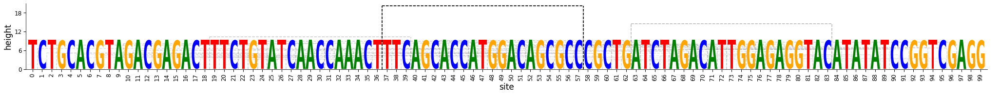

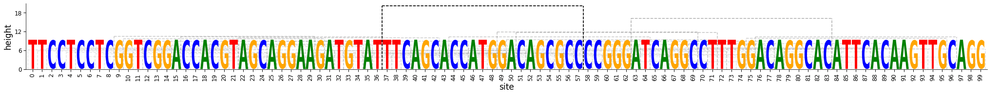

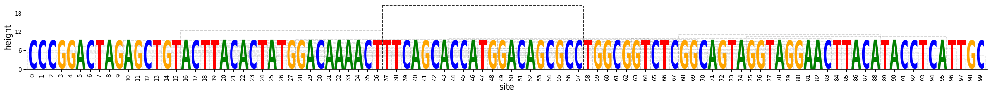

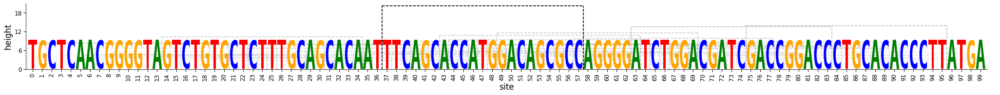

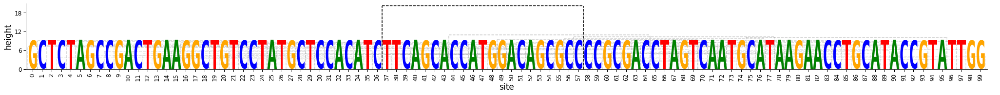

...

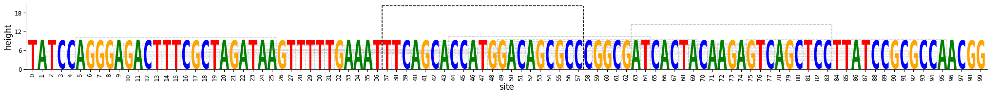

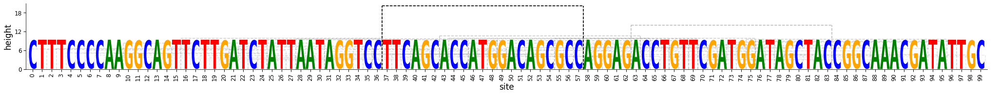

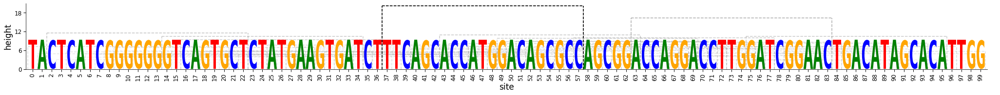

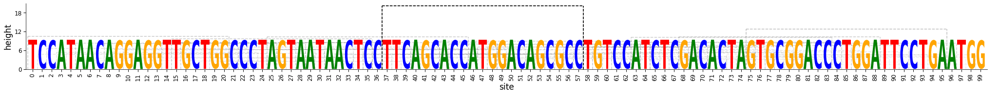

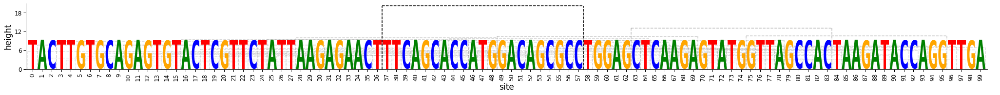

In [18]:
for optimized_sequence in generator.new_seqs[:50]: 
    print('')
    #print(f'Sequence: {optimized_sequence}')
    optimized_sequence = utils.dna2tensor(optimized_sequence)
    scores = motif_scan_score(optimized_sequence.view(1,4,-1))
    best_score_pos, best_score = scores.argmax(), scores.max()

    #fig = plt.figure(figsize=(16,1))
    fig, ax = matrix_to_dms(optimized_sequence)

    #plt.plot(scores.numpy().reshape(-1), 'r-o', color='black')
    for idx, score in enumerate(scores.numpy().reshape(-1)):
        opacity = float(score)/25
        plt.vlines(idx, 0, score, linestyles='dashed', colors='gray', alpha=opacity)
        plt.vlines(idx+21, 0, score, linestyles='dashed', colors='gray', alpha=opacity)
        plt.hlines(score, idx, idx+21, linestyles='dashed', colors='gray', alpha=opacity)
    plt.vlines(best_score_pos.item(), 0, best_score, linestyles='dashed')
    plt.vlines(best_score_pos.item()+21, 0, best_score, linestyles='dashed')
    plt.hlines(best_score.item(), best_score_pos, best_score_pos+21, linestyles='dashed')
    plt.ylim(0,21)
    plt.show()

    # fig, ax = matrix_to_dms(optimized_sequence[:,best_score_pos:best_score_pos+21]*ICM)
    # fig, ax = matrix_to_dms(ICM)

# FastSeqProp Comparison

In [42]:
class FastSeqProp(nn.Module):
    def __init__(self,
                 num_sequences=1,
                 seq_len=200, 
                 padding_len=0,
                 upPad_DNA=None,
                 downPad_DNA=None,
                 vocab_list=['A','C','G','T'],
                 seed=None,
                 **kwargs):
        super(FastSeqProp, self).__init__()
        self.num_sequences = num_sequences
        self.seq_len = seq_len  
        self.padding_len = padding_len
        self.upPad_DNA = upPad_DNA
        self.downPad_DNA = downPad_DNA
        self.vocab_list = vocab_list
        self.seed = seed
        
        self.vocab_len = len(vocab_list)       
        self.noise_factor = 0
        self.softmaxed_logits = None

        self.create_paddingTensors()      
        self.set_seed()
        
        #initialize the trainable logits     
        self.create_differentiable_input_logits(one_hot=False)      
        
        #instance normalization layer
        self.instance_norm = nn.InstanceNorm1d(num_features=self.vocab_len, affine=True)
        
    def forward(self):
        #scaled softmax relaxation
        normalized_logits = self.instance_norm(self.differentiable_logits) + \
             self.noise_factor*torch.randn_like(self.differentiable_logits)
        softmaxed_logits = F.softmax(normalized_logits, dim=1)
        #save attributes without messing the backward graph
        self.softmaxed_logits = softmaxed_logits
        self.padded_softmaxed_logits = self.pad(softmaxed_logits)
        #sample
        nucleotide_probs = Categorical(torch.transpose(softmaxed_logits, 1, 2))
        sampled_idxs = nucleotide_probs.sample()
        sampled_nucleotides_T = F.one_hot(sampled_idxs, num_classes=self.vocab_len)        
        sampled_nucleotides = torch.transpose(sampled_nucleotides_T, 1, 2)
        sampled_nucleotides = sampled_nucleotides - softmaxed_logits.detach() + softmaxed_logits  #ST estimator trick
        softmaxed_logits, sampled_nucleotides = self.pad(softmaxed_logits), self.pad(sampled_nucleotides)
        return softmaxed_logits, sampled_nucleotides
    
    def create_differentiable_input_logits(self, one_hot=True):
        size = (self.num_sequences, self.vocab_len, self.seq_len)
        if one_hot:
            differentiable_logits = np.zeros(size)
            for seqIdx in range(self.num_sequences):
                for step in range(self.seq_len):
                    randomNucleotide = np.random.randint(self.vocab_len)
                    differentiable_logits[seqIdx, randomNucleotide, step] = 1       
            self.differentiable_logits = nn.Parameter(torch.tensor(differentiable_logits, dtype=torch.float))  
        else:
            self.differentiable_logits = nn.Parameter(torch.randn(size))
         
    def set_seed(self):
        if self.seed is not None:
            np.random.seed(self.seed)
            torch.manual_seed(self.seed)
            if torch.cuda.is_available():
                torch.cuda.manual_seed(self.seed)
                
    def create_paddingTensors(self):
        assert self.padding_len >= 0 and type(self.padding_len) == int, 'Padding must be a nonnegative integer'
        if self.padding_len > 0:
            assert self.padding_len <= (len(self.upPad_DNA) + len(self.downPad_DNA)), 'Not enough padding available'
            upPad_logits, downPad_logits = self.dna2tensor(self.upPad_DNA), \
                                         self.dna2tensor(self.downPad_DNA)
            upPad_logits, downPad_logits = upPad_logits[:,-self.padding_len//2 + self.padding_len%2:], \
                                         downPad_logits[:,:self.padding_len//2 + self.padding_len%2]
            upPad_logits, downPad_logits = upPad_logits.repeat(self.num_sequences, 1, 1), \
                                         downPad_logits.repeat(self.num_sequences, 1, 1)
            self.register_buffer('upPad_logits', upPad_logits)
            self.register_buffer('downPad_logits', downPad_logits)
        else:
            self.upPad_logits, self.downPad_logits = None, None

    def pad(self, tensor):
        if self.padding_len > 0:
            padded_tensor = torch.cat([ self.upPad_logits, tensor, self.downPad_logits], dim=2)
            return padded_tensor
        else: 
            return tensor
    
    def dna2tensor(self, sequence_str):
        seq_tensor = np.zeros((self.vocab_len, len(sequence_str)))
        for letterIdx, letter in enumerate(sequence_str):
            seq_tensor[self.vocab_list.index(letter), letterIdx] = 1
        seq_tensor = torch.Tensor(seq_tensor)
        return seq_tensor
    
    def optimize(self, fitness_fn, loss_fn, steps=20, learning_rate=0.5, 
                 step_print=5, lr_scheduler=True, noise_factor=0):
        self.noise_factor = noise_factor
        if lr_scheduler:
            etaMin = 0.000001
        else:
            etaMin = learning_rate
        optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate)
        scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=steps, eta_min=etaMin)      
        print('-----Initial logits-----')
        print(self.pad(self.differentiable_logits).detach().numpy())
        print('-----Training steps-----')
        loss_hist  = []
        for step in range(1, steps+1):
            optimizer.zero_grad()
            softmaxed_logits, sampled_nucleotides = self()
            fitnesses = fitness_fn(sampled_nucleotides)
            loss = loss_fn(fitnesses)
            loss.backward()
            optimizer.step()
            scheduler.step()
            loss_hist.append(loss.item())
            self.noise_factor = self.noise_factor / np.sqrt(step)
            if step % step_print == 0:
                print(f'step: {step}, loss: {round(loss.item(),6)}, learning_rate: {scheduler.get_last_lr()}, noise factor: {self.noise_factor}')                      
        self.noise_factor = 0
        print('-----Final distribution-----')
        print(self.padded_softmaxed_logits.detach().numpy())
        self.loss_hist = loss_hist
        plt.plot(loss_hist)
        plt.xlabel('Steps')
        vert_label=plt.ylabel('Loss')
        vert_label.set_rotation(90)
        plt.show()
    
    def generate(self, padded=True):
        if self.softmaxed_logits == None:
            warn('The model hasn\'t been trained yet')
            return self.pad(self.differentiable_logits.detach())
        else:
            nucleotide_probs = Categorical(torch.transpose(self.softmaxed_logits, 1, 2))
            sampled_idxs = nucleotide_probs.sample()
            sampled_nucleotides_T = F.one_hot(sampled_idxs, num_classes=self.vocab_len)        
            sampled_nucleotides = torch.transpose(sampled_nucleotides_T, 1, 2)
            if padded:
                sampled_nucleotides = self.pad(sampled_nucleotides)
            return sampled_nucleotides.detach()

In [20]:
def neg_reward_loss(x):
    """Loss for dummy examples
    For maximizing avg reward
    """
    return -torch.mean(x)

generator_2 = FastSeqProp(num_sequences=500,
                    seq_len=100)

-----Initial logits-----
[[[-1.2402204  -0.1687153  -0.82103753 ... -0.27073765 -0.21300964
    0.5798262 ]
  [-0.83468425 -0.8763971  -0.02198768 ... -1.7387002  -0.31864795
    1.9093002 ]
  [ 0.48765194 -0.94158655 -0.30151173 ...  0.02467957 -0.20068096
   -0.16370587]
  [ 1.4924033   0.22423081  1.6558113  ...  2.4586368  -1.0512127
   -0.05107264]]

 [[-0.43597677  0.04110008 -1.5200711  ...  0.90009624 -0.6974092
   -0.88252556]
  [ 0.847663    2.1945846   0.42865682 ...  1.5883931  -0.26964006
   -2.5833714 ]
  [-0.293769   -1.6607641   0.62124056 ...  2.0445614  -0.6930427
   -1.1508305 ]
  [-0.517635    1.3711797   0.50723773 ...  0.68051165 -1.7680727
   -0.4399721 ]]

 [[ 1.7297202   0.63998646 -2.310118   ...  0.57274413  1.6020777
    0.1662263 ]
  [ 0.5994035  -0.04951128  0.43334696 ... -1.0926876   0.2614501
    0.634535  ]
  [ 1.3158985  -0.3270743   1.3921026  ... -0.49191332 -0.7649772
   -0.45636553]
  [ 0.9291084   1.0903378  -1.5515321  ...  0.36106214 -0.8474908

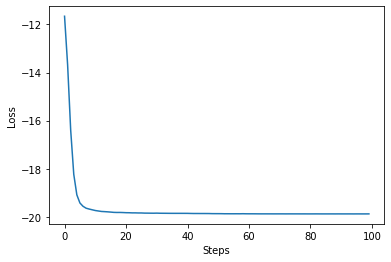

In [21]:
generator_2.optimize(fitness_fn=motif_max_score,
                     loss_fn=neg_reward_loss,
                     steps=100,
                     noise_factor=0.01)

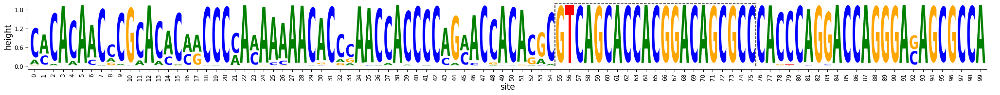

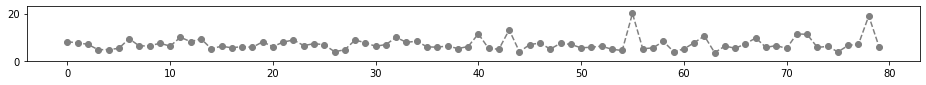

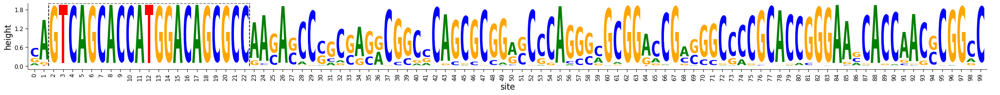

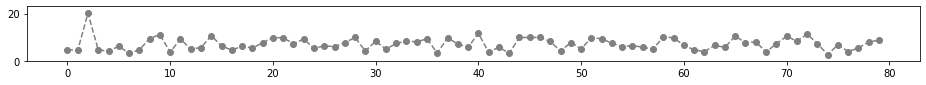

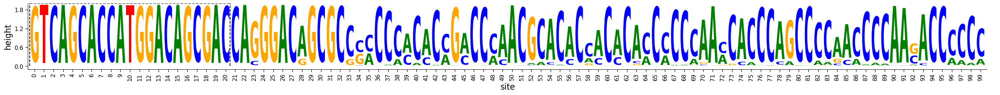

...

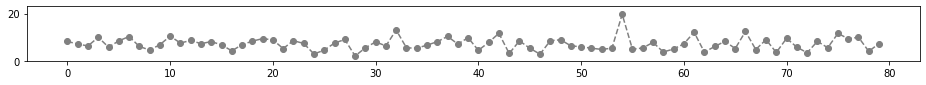

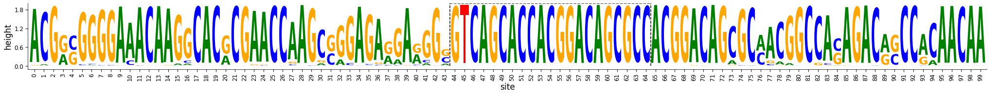

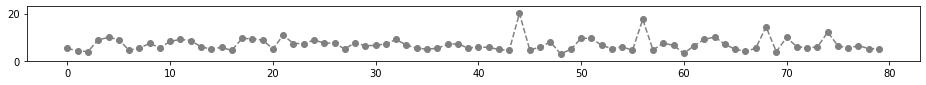

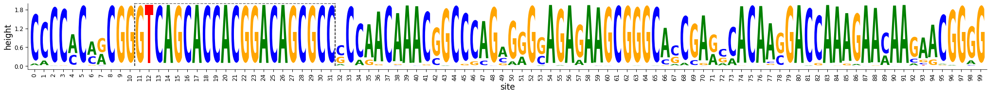

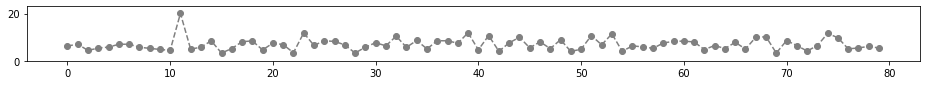

In [22]:
for idx in range(20):
    sequence_tensor = generator_2.softmaxed_logits.detach()[idx,:,:]
    seq_icm = ppm_to_IC(sequence_tensor)
    fig, ax = matrix_to_dms(seq_icm)
    #plt.ylim(0,21)

    scores = motif_scan_score(sequence_tensor.view(1,4,-1))
    best_score_pos, best_score = scores.argmax(), scores.max()

    
    # for idx, score in enumerate(scores.numpy().reshape(-1)):
    #     opacity = float(score)/25
    #     plt.vlines(idx, 0, score, linestyles='dashed', colors='gray', alpha=opacity)
    #     plt.vlines(idx+21, 0, score, linestyles='dashed', colors='gray', alpha=opacity)
    #     plt.hlines(score, idx, idx+21, linestyles='dashed', colors='gray', alpha=opacity)
        
    plt.vlines(best_score_pos.item(), 0, best_score, linestyles='dashed')
    plt.vlines(best_score_pos.item()+21, 0, best_score, linestyles='dashed')
    plt.hlines(2, best_score_pos, best_score_pos+21, linestyles='dashed')
    
    #plt.ylim(0,21)
    plt.show()

    fig = plt.figure(figsize=(16,1))
    plt.plot(scores.numpy().reshape(-1), 'r--o', color='gray')
    plt.ylim(0,23)
    plt.show()
    print('')

#Optimizing for two motifs

In [23]:
# GATA1::TAL1 motif
gata_motif_string = """1114.00 206.00 318.00 4955.00   0.00   0.00 2049.00 658.00 963.00 1191.00 1778.00 1038.00 1352.00 1885.00 1381.00 110.00 4659.00 160.00
2038.00 807.00   0.00   0.00   0.00 4955.00  63.00 1331.00 1214.00 1127.00 1130.00 1237.00 1142.00 1033.00 1237.00 4822.00   0.00 890.00
967.00 159.00   0.00   0.00   0.00   0.00  55.00 2214.00 1244.00 1520.00 990.00 1712.00 1466.00 820.00 1884.00  23.00   0.00 3544.00
836.00 3783.00 4637.00   0.00 4955.00   0.00 2788.00 752.00 1534.00 1117.00 1057.00 968.00 995.00 1217.00 453.00   0.00 296.00 361.00"""

gata_PCM = motif_str_to_counts(gata_motif_string)
gata_PPM = counts_to_ppm(gata_PCM)
gata_PWM = ppm_to_pwm(gata_PPM)
gata_ICM = ppm_to_IC(gata_PPM)

# REST motif
rest_motif_string = """211.00  58.00  76.00 1452.00  34.00 122.00 1575.00   3.00  35.00 913.00 219.00  39.00  20.00 1406.00  13.00 1574.00  42.00 205.00 366.00 213.00 179.00
174.00 269.00 1366.00  30.00  44.00 978.00   7.00 1586.00 1481.00 201.00 375.00   7.00   5.00 112.00 1280.00   9.00  13.00 1007.00  31.00 933.00 1114.00
366.00 146.00  50.00  94.00 1516.00 323.00  12.00  12.00  20.00 162.00 124.00 1551.00 1577.00  34.00 233.00   7.00 1530.00 183.00 688.00 319.00  37.00
840.00 1124.00 105.00  26.00  10.00 182.00  12.00   5.00  70.00 329.00 886.00   7.00   2.00  51.00  74.00  10.00   9.00 198.00 507.00 125.00 260.00"""

rest_PCM = motif_str_to_counts(rest_motif_string)
rest_PPM = counts_to_ppm(rest_PCM)
rest_PWM = ppm_to_pwm(rest_PPM)
rest_ICM = ppm_to_IC(rest_PPM)

In [24]:
class motif_contrast_score(nn.Module):
    def __init__(self, motif):
        super().__init__()
        self.motif = motif
        self.filter = nn.Conv1d(motif.shape[0], 1, motif.shape[1], 
                               bias=False)
        self.filter.weight.data = motif.view(1,4,-1)
        self.filter.weight.requires_grad = False
        self.loss = nn.KLDivLoss(reduction='mean', log_target=False)
        
    def forward(self, in_tensor):
        all_scores = self.filter(in_tensor)
        max_score = all_scores.max(dim=-1)[0]
        contrast = max_score - (torch.sum(all_scores, dim=-1) - max_score) / (all_scores.shape[2] - 1)
        return contrast #- self.loss(in_tensor[:-1], in_tensor[1:])

class motif_max_score(nn.Module):
    def __init__(self, motif):
        super().__init__()
        self.motif = motif
        self.filter = nn.Conv1d(motif.shape[0], 1, motif.shape[1], 
                               bias=False)
        self.filter.weight.data = motif.view(1,4,-1)
        self.filter.weight.requires_grad = False
        self.loss  = nn.KLDivLoss(reduction='none', log_target=True)
        
    def forward(self, in_tensor):
        return self.filter(in_tensor).max(dim=-1).values

class two_motif_scoring(nn.Module):
    def __init__(self, motif_1, motif_2, motif_scoring):
        super().__init__()
        self.motif_scoring = motif_scoring
        self.motif_1_scoring = self.motif_scoring(motif_1)
        self.motif_2_scoring = self.motif_scoring(motif_2)
    
    def forward(self, in_tensor):
        return self.motif_1_scoring(in_tensor) + self.motif_2_scoring(in_tensor)

In [25]:
gata_scan_score = scan_simple_score(gata_ICM)
rest_scan_score = scan_simple_score(rest_ICM)

two_motif_contrast_score = two_motif_scoring(gata_ICM, rest_ICM, motif_contrast_score)
two_motif_max_score = two_motif_scoring(gata_ICM, rest_ICM, motif_max_score)

###FastSeqProp with two motifs

-----Initial logits-----
[[[-0.7382621   0.8209676  -0.594407   ... -0.4726213  -0.9720176
   -0.08010239]
  [-2.8208697  -1.4402057  -0.45501027 ... -0.5312476   0.5007054
    1.0202138 ]
  [-1.2339079   3.0807295  -0.58023256 ... -1.6546866   1.451441
    0.23117422]
  [-0.7371956   0.09316454  2.43406    ...  0.15799902 -0.89212406
   -0.8979976 ]]

 [[-0.39442393  1.7870674   1.0318295  ... -1.3555017  -0.5676521
    0.85310155]
  [ 0.9956765  -0.19590555 -1.3276598  ... -1.5779985   1.6558303
   -0.68916684]
  [ 0.48530343  0.62333333 -1.0963745  ...  0.20075168  0.677139
   -1.6932423 ]
  [-1.4429518   0.77881974 -0.46338823 ...  0.71387464 -0.07660116
    1.9258484 ]]

 [[ 0.17210491  0.66396916  0.12519206 ... -1.1186421   0.18016659
    0.8948572 ]
  [ 0.84042263  0.03748663 -1.4762884  ... -0.15392563  0.95536184
   -0.8523538 ]
  [-0.01677922 -0.3937766  -0.12102399 ...  0.19357905 -0.78311425
   -1.4296365 ]
  [-0.704261   -1.3745152  -0.7453765  ... -0.81358266  1.560847
 

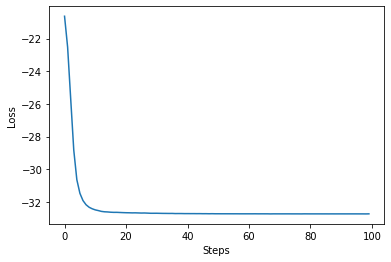

In [30]:
generator_2 = FastSeqProp(num_sequences=500,
                    seq_len=100)

generator_2.optimize(fitness_fn=two_motif_max_score,
                     loss_fn=neg_reward_loss,
                     steps=100,
                     noise_factor=0.01)

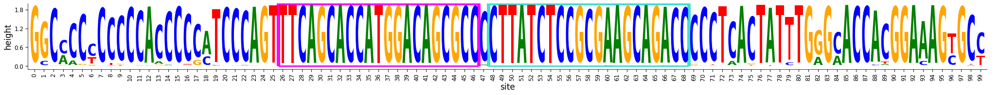

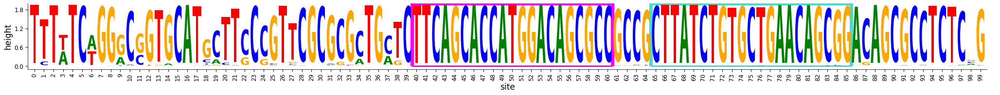

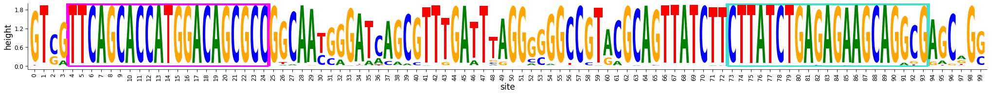

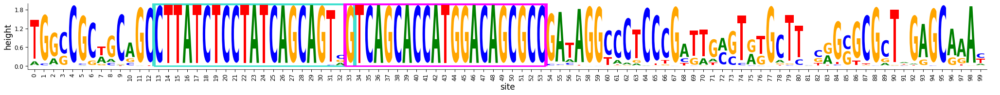

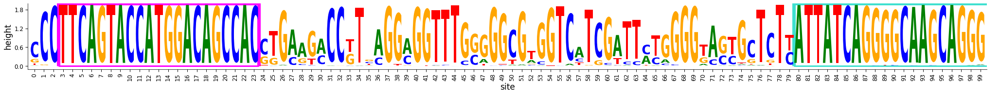

...

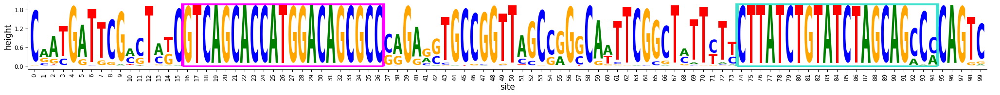

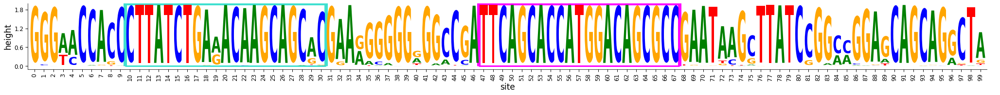

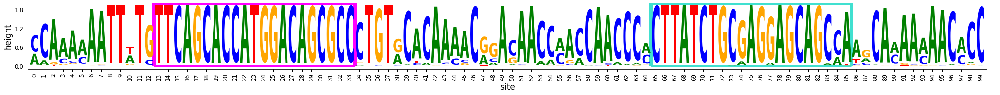

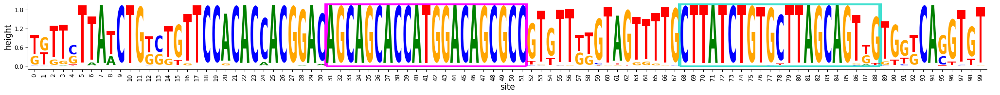

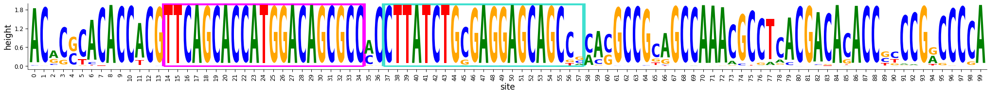

In [35]:
for idx in range(20):
    sequence_tensor = generator_2.softmaxed_logits.detach()[idx,:,:]
    seq_icm = ppm_to_IC(sequence_tensor)

    gata_scores = gata_scan_score(sequence_tensor.view(1,4,-1))
    gata_best_score_pos, gata_best_score = gata_scores.argmax(), gata_scores.max()

    rest_scores = rest_scan_score(sequence_tensor.view(1,4,-1))
    rest_best_score_pos, rest_best_score = rest_scores.argmax(), rest_scores.max()

    fig, ax = matrix_to_dms(seq_icm)
    # for idx, score in enumerate(scores.numpy().reshape(-1)):
    #     opacity = float(score)/25
    #     plt.vlines(idx, 0, score, linestyles='dashed', colors='gray', alpha=opacity)
    #     plt.vlines(idx+21, 0, score, linestyles='dashed', colors='gray', alpha=opacity)
    #     plt.hlines(score, idx, idx+21, linestyles='dashed', colors='gray', alpha=opacity)
        
    plt.vlines(gata_best_score_pos.item(), 0, gata_best_score, linestyles='solid', colors='turquoise', linewidth=7.0)
    plt.vlines(gata_best_score_pos.item()+21, 0, gata_best_score, linestyles='solid', colors='turquoise', linewidth=7.0)
    plt.hlines(2, gata_best_score_pos, gata_best_score_pos+21, linestyles='solid', colors='turquoise', linewidth=7.0)
    plt.hlines(0, gata_best_score_pos, gata_best_score_pos+21, linestyles='solid', colors='turquoise', linewidth=3.0)

    plt.vlines(rest_best_score_pos.item(), 0, gata_best_score, linestyles='solid', colors='magenta', linewidth=7.0)
    plt.vlines(rest_best_score_pos.item()+21, 0, gata_best_score, linestyles='solid', colors='magenta', linewidth=7.0)
    plt.hlines(2, rest_best_score_pos, rest_best_score_pos+21, linestyles='solid', colors='magenta', linewidth=7.0)
    plt.hlines(0, rest_best_score_pos, rest_best_score_pos+21, linestyles='solid', colors='magenta', linewidth=3.0)

    #plt.ylim(0,21)

    # fig = plt.figure(figsize=(16,1))
    # plt.plot(gata_scores.numpy().reshape(-1), 'r--o', color='gray')
    # plt.plot(rest_scores.numpy().reshape(-1), 'r--o', color='black')
    # plt.ylim(0,23)
    plt.show()
    print('')

###AdaLead with two motifs

In [47]:
generator = AdaLead(model_queries_per_batch = 5000,
                eval_batch_size = 100,
                sequences_batch_size = 500,
                rho = 40,
                threshold = 0.25,
                recomb_rate = 0.5,
                mu = 1,
                seq_len = 100,
                padding_len = 0,
                fitness_fn = two_motif_max_score)

#generator.cuda()
t = time.process_time()
generator.run(num_iterations=12)
print('')
print('Top 5 sequences:')
print('')
print(f'{generator.new_seqs[:5]}')
print('')
print(f'Top 5 fitnesses: {generator.preds[:5]}')
print(f'Processing time: {round(time.process_time() - t, 2)} s')

Iterations: 100%|██████████| 12/12 [00:29<00:00,  2.45s/it, Initial top fitness=26.9, Final top fitness=28]


Top 5 sequences:

['CCGTGAGTGTTAATAGTTCGTATTACTTTATCTGAGCTAAGCAGGTCTTCGTTACAGTCCATAAGCAGGGCCATACGGACCCCGGACGGTTGCGCCCCAA'
 'CCGTGAGTGTTAATAGTTCATATTACTTTATCTGAGCTAAGCAGGTCTTCGTTACAGTCCATAAGCAGGGCCATACGGACCCCGGACGGTTGCGCCCCAA'
 'CCGTGAGTGTTAATAGTTCGTATTACTTTATCTGAGCTAAGCAGGTCTTCGTTACAGTCCATAAGCTGGGCCATACGGACCCCGGACGGTTTCGCCCCCA'
 'CCGTGAGTGTTAATAGTTCGTATTACTTTATCTGAGCTAAGCAGGTCTTCGTTACAGTCCATAAGCAGGGCCATACGGACCCCGGACGGTTTCGCCCCCA'
 'CCGTGAGTGTCAATAGTTCGTATTACTTTATCTGATCTAAGCAGGTCTTCGTTACAGTCCATAAGCTGGGCCATACGGACCCCGGACGGTTTCGCCCCCA']

Top 5 fitnesses: [27.98987961 27.98987961 27.94061852 27.94061852 27.93962479]
Processing time: 29.08 s


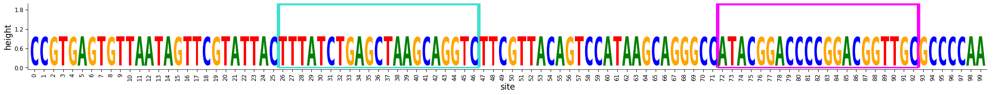

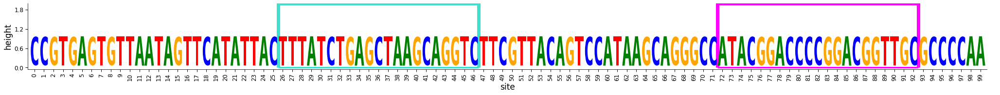

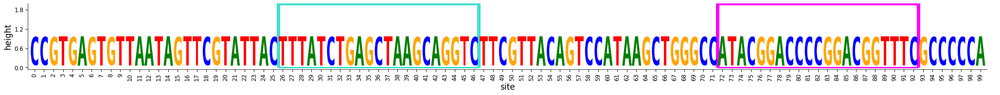

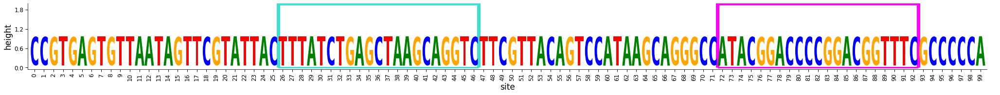

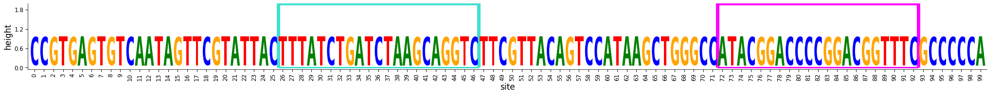

...

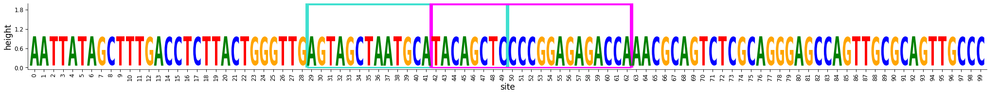

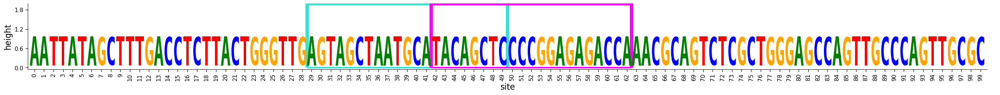

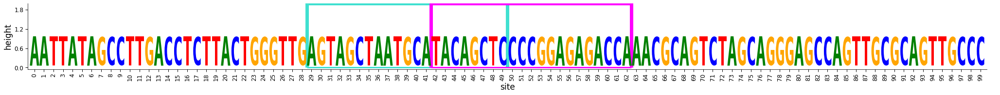

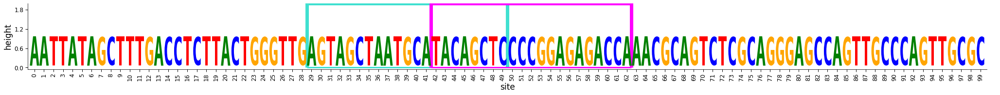

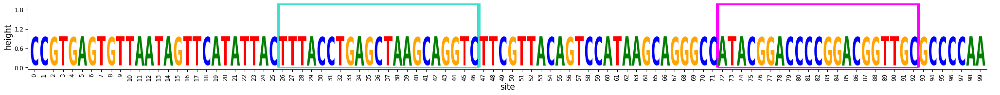

In [48]:
for optimized_sequence in generator.new_seqs[:20]: 
    print('')
    sequence_tensor = utils.dna2tensor(optimized_sequence)

    gata_scores = gata_scan_score(sequence_tensor.view(1,4,-1))
    gata_best_score_pos, gata_best_score = gata_scores.argmax(), gata_scores.max()

    rest_scores = rest_scan_score(sequence_tensor.view(1,4,-1))
    rest_best_score_pos, rest_best_score = rest_scores.argmax(), rest_scores.max()

    #fig = plt.figure(figsize=(16,1))
    fig, ax = matrix_to_dms(sequence_tensor)

    plt.vlines(gata_best_score_pos.item(), 0, gata_best_score, linestyles='solid', colors='turquoise', linewidth=7.0)
    plt.vlines(gata_best_score_pos.item()+21, 0, gata_best_score, linestyles='solid', colors='turquoise', linewidth=7.0)
    plt.hlines(2, gata_best_score_pos, gata_best_score_pos+21, linestyles='solid', colors='turquoise', linewidth=7.0)
    plt.hlines(0, gata_best_score_pos, gata_best_score_pos+21, linestyles='solid', colors='turquoise', linewidth=3.0)

    plt.vlines(rest_best_score_pos.item(), 0, gata_best_score, linestyles='solid', colors='magenta', linewidth=7.0)
    plt.vlines(rest_best_score_pos.item()+21, 0, gata_best_score, linestyles='solid', colors='magenta', linewidth=7.0)
    plt.hlines(2, rest_best_score_pos, rest_best_score_pos+21, linestyles='solid', colors='magenta', linewidth=7.0)
    plt.hlines(0, rest_best_score_pos, rest_best_score_pos+21, linestyles='solid', colors='magenta', linewidth=3.0)
    #plt.ylim(0,21)
    plt.show()

    # fig, ax = matrix_to_dms(optimized_sequence[:,best_score_pos:best_score_pos+21]*ICM)
    # fig, ax = matrix_to_dms(ICM)